In [1]:
!pip install wandb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.7/251.7 kB 15.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.4 MB/s eta 0:00:00


In [2]:
import os
import wandb
import matplotlib.pyplot as plt
import torch
from PIL import Image

In [3]:
# Подключение гугл диска
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!wandb login --relogin
wandb.login()

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


wandb: Currently logged in as: parshin_d (dentist_ai). Use `wandb login --relogin` to force relogin


True

In [ ]:
#run = wandb.init(
#    entity="dentist_ai",
#    project="Dentist_AI")

In [ ]:
# Скачивание датасета с wandb.

path_to_data = "drive/MyDrive/Colab Notebooks/ML_System_Design/data/dentasis_v30_5_Dental_disease_detection_Occlus_v0-v0"

if os.path.isdir(path_to_data):
    artifact_dir = path_to_data
else:
    artifact = run.use_artifact("dentist_ai/Dentist_AI/dentasis_v30_5_Dental_disease_detection_Occlus_v0:v0", type="dataset")
    artifact_dir = artifact.download(path_to_data)

In [ ]:
# Переходим в папку YOLO куда будем копировать данные с гитхаба
%cd drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5

# Копируем данные с гитхаба
#!git clone https://github.com/ultralytics/yolov5

# После копирования переходим в папку yolov5 и ставим список библиотек из файла
%cd yolov5
%pip install -qr requirements.txt

/content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5


In [6]:
%cd /content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5/yolov5

/content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5/yolov5


In [7]:
# Задаём параметры обучения модели. Размер картинок 640 на 640 (такой размер фото в датасете).
# Батчсайз 4, количество эпох 30.
# Интервал сохранения пример валидации в wandb
# Путь к yaml файлу где указано количество классов и пути к папкам с картинками
# Стартовые веса (маленькая/средняя/большая модель)

!python train.py --img 640\
--batch 4\
--epochs 60\
--optimizer SGD\
--project Dentist_AI \
--data '/content/drive/MyDrive/Colab Notebooks/ML_System_Design/data/dentasis_v30_5_Dental_disease_detection_Occlus_v0-v0/data.yaml'\
--weights yolov5m6.pt

mean  (0.485, 0.456, 0.406)
std (0.229, 0.224, 0.225)
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2023-11-25 22:04:06.071352: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-25 22:04:06.071405: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-25 22:04:06.071467: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: Currently logged in as: parshin_d (dentist_ai). Use `wandb login --relogin` to force relogin
train: weights=yolov5m6.pt, cfg=, data=/content

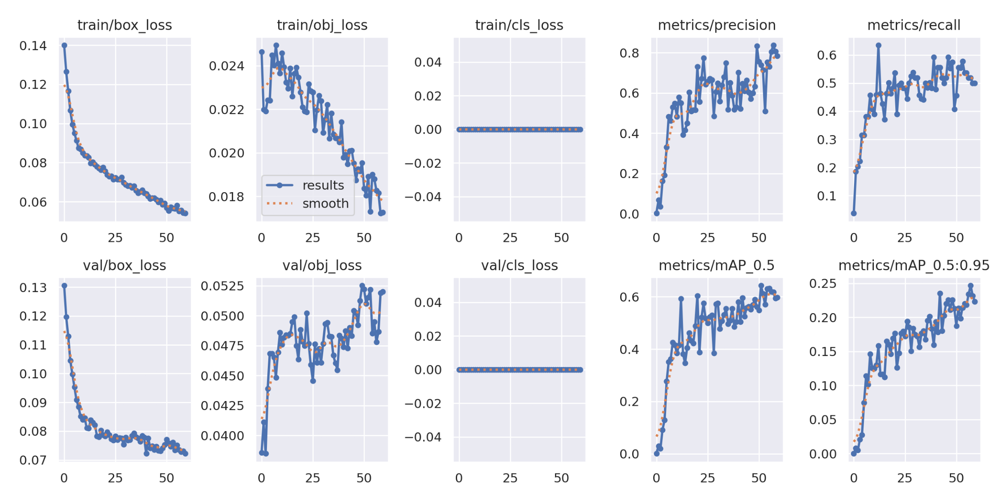

In [8]:
# Выведем графики обучения модели (укажем путь к картинке в которую сохраняется результат)
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('/content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5/yolov5/Dentist_AI/exp16/results.png'))

In [9]:
# Путь куда сохранялись веса дообученной модели
# Путь к папке с файлами yolo
model_path = '/content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5/yolov5/Dentist_AI/exp16/weights/best.pt'
yolo_path = '/content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5/yolov5'

# Загрузка модели из торч хаб и загрузка в неё ранее сохранённых весов
model = torch.hub.load(yolo_path, 'custom', path=model_path, source='local')

# Путь к тестовым картинкам
path_to_test = "/content/drive/MyDrive/Colab Notebooks/ML_System_Design/data/dentasis_v30_5_Dental_disease_detection_Occlus_v0-v0/test/images/"
test_list = os.listdir(path_to_test)

mean  (0.485, 0.456, 0.406)
std (0.229, 0.224, 0.225)


YOLOv5 🚀 2023-9-25 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 276 layers, 35248920 parameters, 0 gradients, 48.9 GFLOPs
Adding AutoShape... 


In [10]:
!python val.py --weights '/content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5/yolov5/Dentist_AI/exp16/weights/best.pt'\
--data '/content/drive/MyDrive/Colab Notebooks/ML_System_Design/data/dentasis_v30_5_Dental_disease_detection_Occlus_v0-v0/data.yaml'\
--task test\
--name "/content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5/yolov5/Dentist_AI/yolo5_test16/"

mean  (0.485, 0.456, 0.406)
std (0.229, 0.224, 0.225)
val: data=/content/drive/MyDrive/Colab Notebooks/ML_System_Design/data/dentasis_v30_5_Dental_disease_detection_Occlus_v0-v0/data.yaml, weights=['/content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5/yolov5/Dentist_AI/exp16/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=/content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5/yolov5/Dentist_AI/yolo5_test16/, exist_ok=False, half=False, dnn=False
fatal: cannot change to '/content/drive/MyDrive/Colab': No such file or directory
YOLOv5 🚀 2023-9-25 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 276 layers, 35248920 parameters, 0 gradients, 48.9 GFLOPs
test: Scanning /content/drive/MyDrive/Colab Notebooks/ML_System_De

In [11]:
# Запустим проверку работы сохраненной обученной модели на тестовом датасете.

!python detect.py --source '/content/drive/MyDrive/Colab Notebooks/ML_System_Design/data/dentasis_v30_5_Dental_disease_detection_Occlus_v0-v0/test/images/' --weights '/content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5/yolov5/Dentist_AI/exp16/weights/best.pt' --img 640 --save-txt --save-crop

mean  (0.485, 0.456, 0.406)
std (0.229, 0.224, 0.225)
detect: weights=['/content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5/yolov5/Dentist_AI/exp16/weights/best.pt'], source=/content/drive/MyDrive/Colab Notebooks/ML_System_Design/data/dentasis_v30_5_Dental_disease_detection_Occlus_v0-v0/test/images/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_csv=False, save_conf=False, save_crop=True, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
fatal: cannot change to '/content/drive/MyDrive/Colab': No such file or directory
YOLOv5 🚀 2023-9-25 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 276 layers, 35248920 parameters, 0 gradients, 48.9 GFLOPs
image 1/31 /content/drive

In [12]:
# Путь до сохраненных результатов работы модели на тетовом множестве.
path_to_output = "/content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5/yolov5/runs/detect/exp16/"
output_list = os.listdir(path_to_test)

print(output_list)

['011_00525_11_a091_jpg.rf.51dd506635b6777ab60e814b51cb76ac.jpg', '011_00501_07_a091_jpg.rf.3f51f3501d4d722129dd4ccb84200483.jpg', '011_00501_11_a091_jpg.rf.3e7a1246abb0efaa2306fae3229a07d3.jpg', '011_00509_12_a091_jpg.rf.0d5ed3e717379bec9357a741baf6f141.jpg', '011_00525_12_a091_jpg.rf.9a1f7535145f35326a58d3fbe6223b50.jpg', '010_00506_06_a091_jpg.rf.cebb8bcd4c59507cf64be64ae5af0033.jpg', '011_00512_11_a091_jpg.rf.9b2abfdd7828bcbf79e48231e5d6234f.jpg', '010_00550_11_a091_jpg.rf.8bf594069b356df23d288d922b5299fc.jpg', '010_00508_06_a091_jpg.rf.0984518d7f351b59917e4bcd2bd3be74.jpg', '011_00501_09_a091_jpg.rf.36e064b005850f6cadc4472902a1a02f.jpg', '011_00491_12_a091_jpg.rf.f28b0079d0706ea5e2a26de1b7e75968.jpg', '010_00550_12_a091_jpg.rf.274834dedf9318022c146452b4b02e4a.jpg', '011_00501_10_a091_jpg.rf.4eccbe0349c4ce63287d67d788eaeef7.jpg', '018_00052_01_a091_jpg.rf.02a08786f9f090ec1048f7f6219b1e56.jpg', '010_00496_10_a091_jpg.rf.8bb02469cd2815d13f975e1d27d3c052.jpg', '019_00051_12_a091_jpg.r

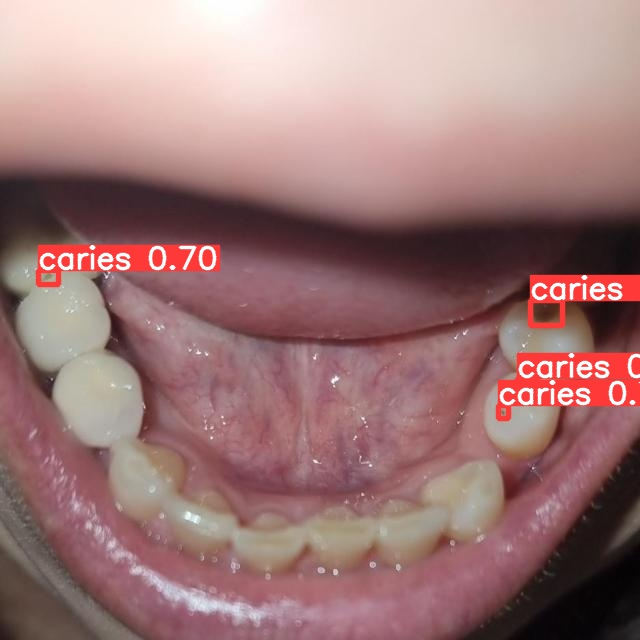

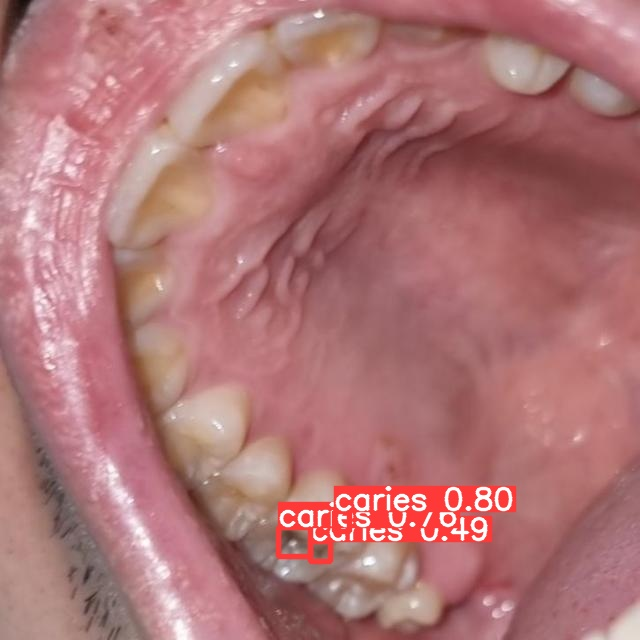

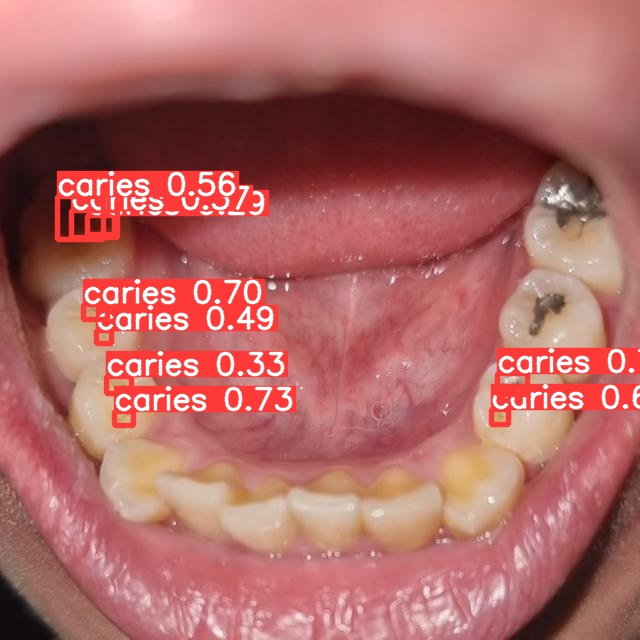

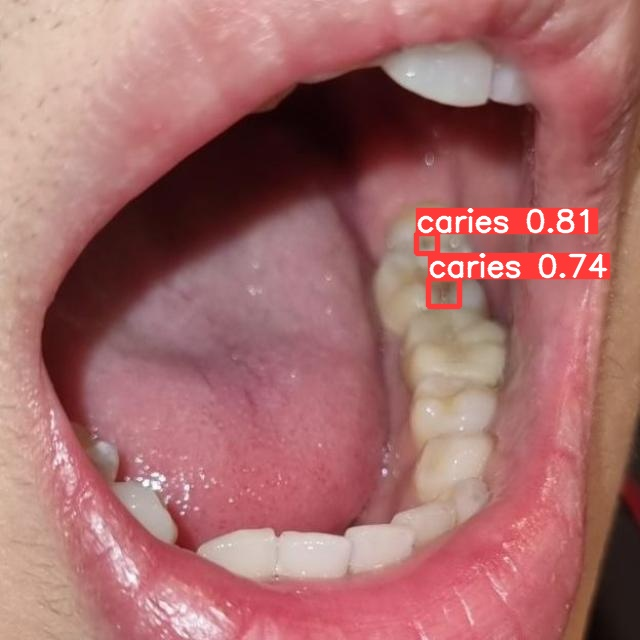

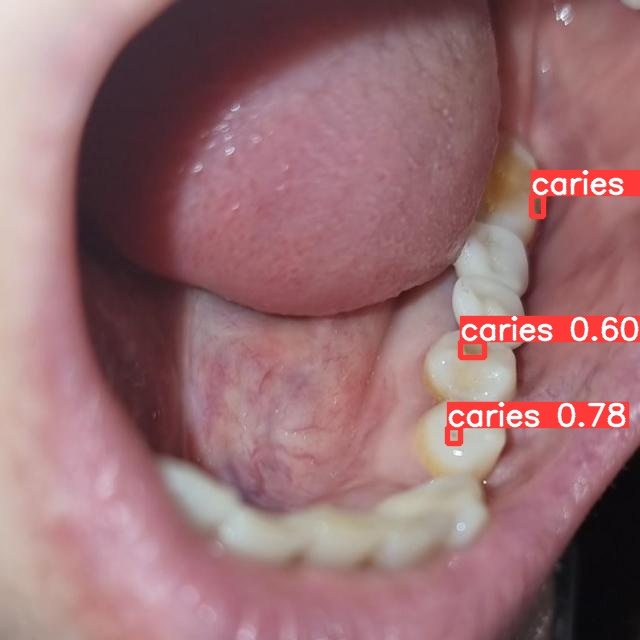

...

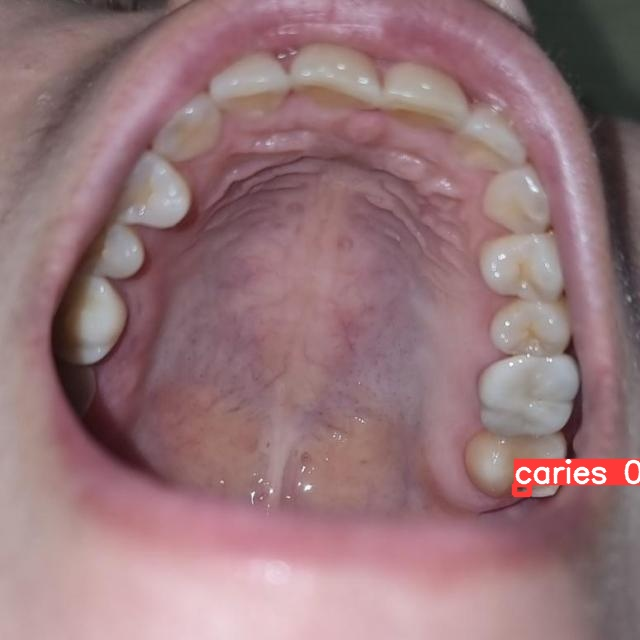

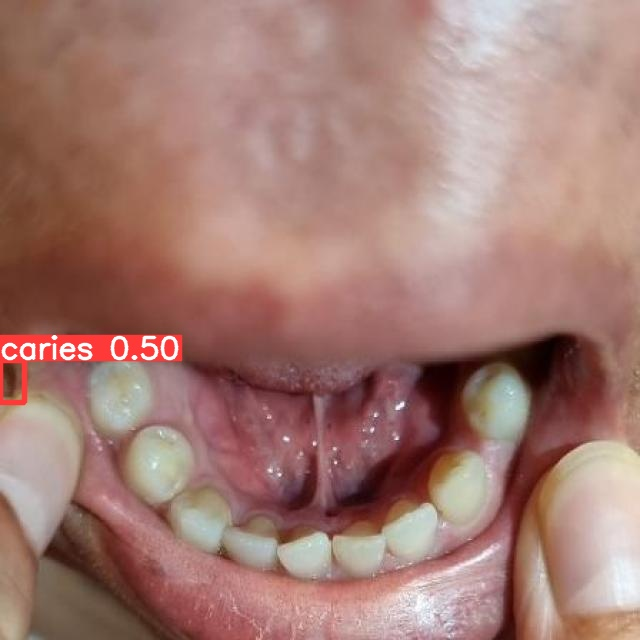

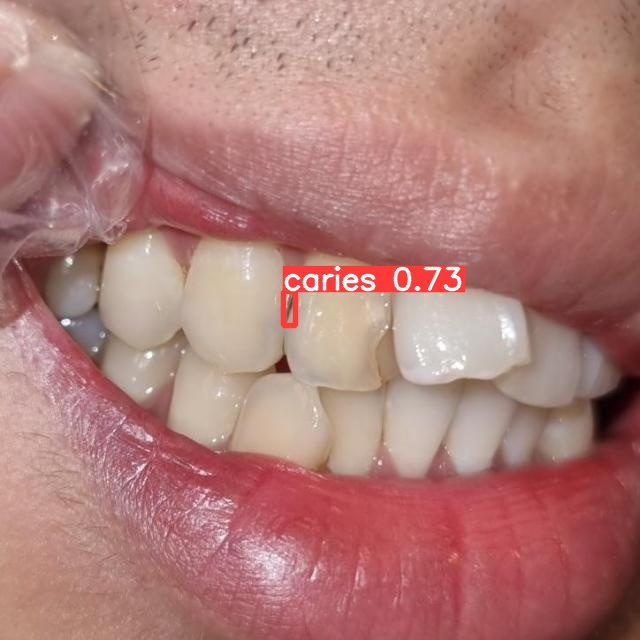

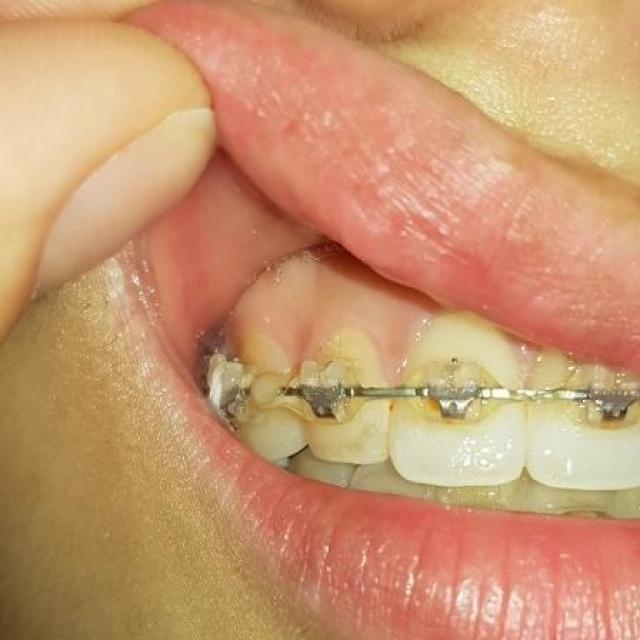

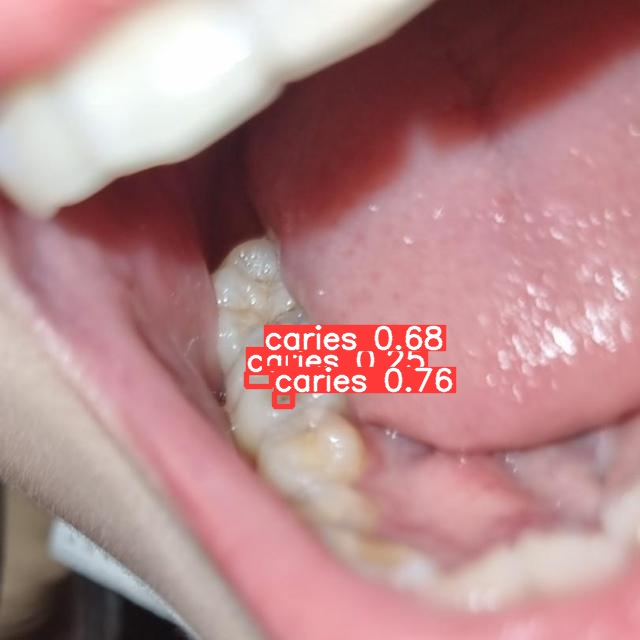

In [13]:
# Посмотрим на результат работы модели. Выведем изображения с боксами.
for out in output_list:
  image = Image.open(path_to_output + out)
  display(image)